In [62]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import plotly.figure_factory as ff
import plotly.graph_objects as go
import numpy as np
import plotly.express as px
import re

In [63]:
data= pd.read_csv('earthquakes.csv', delimiter=',')
data.head()

,No,Deprem Kodu,Olus tarihi,Olus zamani,Enlem,Boylam,Derinlik,xM,MD,ML,Mw,Ms,Mb,Tip,Yer
0,1,20230430130127,2023.04.30,13:01:27.69,38.3392,37.7633,8.7,4.3,0.0,4.3,4.3,0.0,0.0,Ke,KEPEZ-AKCADAG (MALATYA) [East 1.7 km]
1,2,20230430040253,2023.04.30,04:02:53.49,40.8077,31.0708,3.7,3.5,0.0,3.5,3.4,0.0,0.0,Ke,PASAKONAGI- (DUZCE) [South West 0.9 km]
2,3,20230430025122,2023.04.30,02:51:22.15,35.6422,34.0252,22.4,3.5,0.0,3.5,3.5,0.0,0.0,Ke,AKDENIZ
3,4,20230429194832,2023.04.29,19:48:32.87,37.8623,36.2185,5.0,4.0,0.0,3.9,4.0,0.0,0.0,Ke,KARAKUYU-SAIMBEYLI (ADANA) [East 1.4 km]
4,5,20230429175829,2023.04.29,17:58:29.20,38.0220,36.4457,5.0,3.7,0.0,3.7,3.4,0.0,0.0,Ke,YIRICEK-GOKSUN (KAHRAMANMARAS) [North West 2....


In [64]:
data = data.drop(['No', 'Deprem Kodu', 'Tip'], axis=1)
data.head()

,Olus tarihi,Olus zamani,Enlem,Boylam,Derinlik,xM,MD,ML,Mw,Ms,Mb,Yer
0,2023.04.30,13:01:27.69,38.3392,37.7633,8.7,4.3,0.0,4.3,4.3,0.0,0.0,KEPEZ-AKCADAG (MALATYA) [East 1.7 km]
1,2023.04.30,04:02:53.49,40.8077,31.0708,3.7,3.5,0.0,3.5,3.4,0.0,0.0,PASAKONAGI- (DUZCE) [South West 0.9 km]
2,2023.04.30,02:51:22.15,35.6422,34.0252,22.4,3.5,0.0,3.5,3.5,0.0,0.0,AKDENIZ
3,2023.04.29,19:48:32.87,37.8623,36.2185,5.0,4.0,0.0,3.9,4.0,0.0,0.0,KARAKUYU-SAIMBEYLI (ADANA) [East 1.4 km]
4,2023.04.29,17:58:29.20,38.0220,36.4457,5.0,3.7,0.0,3.7,3.4,0.0,0.0,YIRICEK-GOKSUN (KAHRAMANMARAS) [North West 2....


In [65]:
data['Olus zamani'] = data['Olus zamani'].str.split('.').str[0]
for i in range(0, len(data)):
    if float(data['Olus zamani'][i][6:]) >= 60:
        data = data.drop(i)
data = data.reset_index(drop=True)

In [66]:
olus_zamani = pd.to_datetime(data['Olus tarihi'] + ' ' + data['Olus zamani'])
data['Olus zamani'] = olus_zamani
data.drop(['Olus tarihi'], axis=1, inplace=True)
data.head()

,Olus zamani,Enlem,Boylam,Derinlik,xM,MD,ML,Mw,Ms,Mb,Yer
0,2023-04-30 13:01:27,38.3392,37.7633,8.7,4.3,0.0,4.3,4.3,0.0,0.0,KEPEZ-AKCADAG (MALATYA) [East 1.7 km]
1,2023-04-30 04:02:53,40.8077,31.0708,3.7,3.5,0.0,3.5,3.4,0.0,0.0,PASAKONAGI- (DUZCE) [South West 0.9 km]
2,2023-04-30 02:51:22,35.6422,34.0252,22.4,3.5,0.0,3.5,3.5,0.0,0.0,AKDENIZ
3,2023-04-29 19:48:32,37.8623,36.2185,5.0,4.0,0.0,3.9,4.0,0.0,0.0,KARAKUYU-SAIMBEYLI (ADANA) [East 1.4 km]
4,2023-04-29 17:58:29,38.0220,36.4457,5.0,3.7,0.0,3.7,3.4,0.0,0.0,YIRICEK-GOKSUN (KAHRAMANMARAS) [North West 2....


In [67]:
data['Yer'][19894]

'SAMSUN A�IKLARI (KARADENIZ)'

In [68]:
data['Yer'][19881]

'ELVANCELEBI-MECITOZU (�ORUM) [North West  1.4 km]'

In [69]:
print(data[data['Yer'].str.contains('�')].Yer.nunique())

1133


In [70]:
# Boş dize değerleri içeren bir liste oluşturma
Yer = []
for y in range(len(data)):
    Yer.append("")

# Yer değerlerini boş listeye yerleştirme
for i in range(0, len(data)):
    Yer[i] = data['Yer'][i]

    # Yer değerleri '(' içeriyorsa, sırayla '(', ')' sol ve sağ tarafına bölünür.
    if Yer[i].find("(") != -1:
        Yer[i] = Yer[i].split('(')[1]
        Yer[i] = Yer[i].split(')')[0]
Yer = pd.DataFrame(Yer)
Yer.head()

,0
0,MALATYA
1,DUZCE
2,AKDENIZ
3,ADANA
4,KAHRAMANMARAS


In [71]:
# Getting rid of the string values start with '['
Yer = Yer[0].str.split('[').str[0].to_frame()
Yer.columns = ['Yer']

# Placing the created Yer column to the original dataset
data['Yer'] = Yer

In [72]:

Yer_update = {"?ORUM": "CORUM", "K?TAHYA": "KUTAHYA", "EGE DENiZi": "EGE DENIZI",
              "DiYARBAKIR": "DIYARBAKIR", "T?RKiYE-iRAN SINIR B?LGESi": "TURKIYE-IRAN SINIR BOLGESI",
              "BALIKESiR ": "BALIKESIR", "SiVAS": "SIVAS", "iZMiR": "IZMIR", "TUNCELi": "TUNCELI",
              "SURiYE": "SURIYE", "ESKiSEHiR": "ESKISEHIR", "DENiZLi": "DENIZLI", "BiTLiS": "BITLIS",
              "KiLiS": "KILIS", "VAN G?L?": "VAN GOLU", "?ANKIRI": "CANKIRI",
              "T?RKIYE-IRAN SINIR B?LGESI": "TURKIYE-IRAN SINIR BOLGESI", "MANiSA": "MANISA",
              "AKDENiZ": "AKDENIZ", "G?RCiSTAN": "GURCISTAN", "BiNGOL": "BINGOL", "OSMANiYE": "OSMANIYE",
              "KIRSEHiR": "KIRSEHIR", "MARMARA DENiZi": "MARMARA DENIZI", "ERZiNCAN": "ERZINCAN",
              "BALIKESiR": "BALIKESIR", "GAZiANTEP": "GAZIANTEP", "G?RCISTAN": "GURCISTAN",
              "?ANAKKALE'": "CANAKKALE", "HAKKARi": "HAKKARI", "AFYONKARAHiSAR": "AFYONKARAHISAR",
              "BiLECiK": "BILECIK", "KAYSERi": "KAYSERI", "T?RKiYE-IRAK SINIR B?LGESi": "TURKIYE-IRAK SINIR BOLGESI",
              "KARADENiZ": "KARADENIZ", "T?RKIYE-IRAK SINIR B?LGESI": "TURKIYE-IRAK SINIR BOLGESI",
              "KARAB?K": "KARABUK", "KIBRIS-SADRAZAMK?Y?K": "KIBRIS-SADRAZAMKOY",
              "T?RKIYE-SURIYE SINIR B?LGESI?K": "TURKIYE-SURIYE SINIR BOLGESI", "?ANAKKALE": "CANAKKALE",
              "KIBRIS-SADRAZAMK?Y": "KIBRIS-SADRAZAMKOY", "ERZURUM ": "ERZURUM",
              "T?RKIYE-SURIYE SINIR B?LGESI": "TURKIYE-SURIYE SINIR BOLGESI", "ADANA ": "ADANA", "KUS G?L?": "KUS GOLU",
              "BURDUR ": "BURDUR", "KIBRIS-G?ZELYURT": "KIBRIS-GUZELYURT", "KONYA ": "KONYA",
              "KOCAELI ": "KOCAELI", "AMASYA ": "AMASYA", "KIRSEHIR ": "KIRSEHIR",
              "KIBRIS-KILI?ASLAN": "KIBRIS-KILICASLAN", "KIBRIS-Z?MR?TK?Y": "KIBRIS-ZUMRUTKOY",
              "DENIZLI ": "DENIZLI", "MANISA ": "MANISA", "ULUBAT G?L?": "ULUBAT GOLU",
              "T?RKIYE-ERMENISTAN SINIR B?LGESI": "TURKIYE-ERMENISTAN SINIR BOLGESI",
              "ERZINCAN ": "ERZINCAN", "TOKAT ": "TOKAT", "ARDAHAN ": "ARDAHAN", "G�RCiSTAN-ERMENiSTAN SINIR B�LGESi": "GURCiSTAN-ERMENiSTAN SINIR BOLGESi",
             "�ORUM": "CORUM", "K�TAHYA": "KUTAHYA", "T�RKiYE-iRAN SINIR B�LGESi": "TURKiYE-iRAN SINIR BOLGESi", "VAN G�L�": "VAN GOLU", "�ANKIRI": "CANKIRI",
             "T�RKIYE-IRAN SINIR B�LGESI": "TURKIYE-IRAN SINIR BOLGESI", "G�RCiSTAN": "GURCiSTAN", "G�RCISTAN": "GURCiSTAN", "T�RKiYE-IRAK SINIR B�LGESi": "TURKiYE-IRAK SINIR BOLGESi",
             "T�RKIYE-IRAK SINIR B�LGESI": "TURKIYE-IRAK SINIR BOLGESI", "KARAB�K": "KARABUK", "�ANAKKALE" : "CANAKKALE", "KIBRIS-SADRAZAMK�Y": "KIBRIS-SADRAZAMKOY",
              "T�RKIYE-SURIYE SINIR B�LGESI": "TURKIYE-SURIYE SINIR BOLGESI", "T�RKIYE-ERMENISTAN SINIR B�LGESI": "TURKIYE-ERMENISTAN SINIR BOLGESI", "KUS G�L�": "KUS GOLU",
             "KIBRIS-G�ZELYURT": "KIBRIS-GUZELYURT", "KIBRIS-KILI�ASLAN": "KIBRIS-KILICASLAN", "KIBRIS-Z�MR�TK�Y": "KIBRIS-ZUMRUTKOY", "ULUBAT G�L�": "ULUBAT GOLU"}
data['Yer'] = data['Yer'].replace(Yer_update)
data['Yer'] = data['Yer'].str.upper()

data['Yer'].head()

0          MALATYA
1            DUZCE
2          AKDENIZ
3            ADANA
4    KAHRAMANMARAS
Name: Yer, dtype: object

In [73]:
print(data[data['Yer'].str.contains('�')].Yer.nunique())

0


Number of Earthquakes Annually

In [74]:
aa = data['Olus zamani'].value_counts()
aa = aa.resample('Y').sum().to_frame()
fig = px.line(aa, x=aa.index, y='Olus zamani', text='Olus zamani',
              labels={
                  "index": "Year",
                  "Olus zamani": "Number of Earthquakes"
              }
              )
fig.update_traces(marker=dict(line=dict(color='#000000', width=2)))
fig.update_traces(textposition='top center')
fig.update_layout({'plot_bgcolor': 'rgba(0, 0, 0, 0)'})
fig.update_layout(title_text='Number of Earthquakes Annually',
                  title_x=0.5, title_font=dict(size=24))
fig.show()

In [75]:
fig_hist = px.histogram(data_frame=data, x='Olus zamani')
fig_hist.update_layout(title_text='Distribution of the Earthquakes (Annually)',
                       title_x=0.5, title_font=dict(size=24))
fig_hist.update_layout({'plot_bgcolor': 'rgba(0, 0, 0, 0)'})
fig_hist.update_traces(marker=dict(line=dict(color='#000000', width=2)))
fig_hist.show()

In [76]:
fig = px.histogram(data, x="xM", marginal='rug', hover_data=data.columns)
fig.update_layout(title_text='Distribution of the Magnitudes',
                  title_x=0.5, title_font=dict(size=24))
fig.update_layout({'plot_bgcolor': 'rgba(0, 0, 0, 0)'})
fig.show()

In [77]:
fig = px.histogram(data, x="Derinlik", marginal='rug', hover_data=data.columns)
fig.update_layout(title_text='Distribution of the Depth (km)',
                  title_x=0.5, title_font=dict(size=24))
fig.update_layout({'plot_bgcolor': 'rgba(0, 0, 0, 0)'})
fig.show()

In [78]:
fig = px.scatter(data, x='xM', y='Derinlik')
fig.update_layout(title='The Relationship between the Depth and the Magnitude', title_x=0.5, title_font=dict(size=22))
fig.update_layout({'plot_bgcolor': 'rgba(0, 0, 0, 0)'})
fig.show()

In [79]:
Yer_count = data.groupby(pd.Grouper(key='Yer')).size().reset_index(name='count')
fig = px.treemap(Yer_count, path=['Yer'], values='count')
fig.update_layout(title_text='Number of Earthquakes due to Location',
                  title_x=0.5, title_font=dict(size=24)
                  )
fig.update_traces(textinfo="label+value")
fig.show()

In [80]:
Yer_count = data.groupby(pd.Grouper(key='Yer')).size().reset_index(name='count')
Yer_count_top = Yer_count.nlargest(10, 'count')[['Yer', 'count']]
fig = px.bar(Yer_count_top, x='Yer', y='count', color='Yer', text='count')
fig.update_layout(title_text='Top 10 Frequent Earthquake Locations',
                  title_x=0.5, title_font=dict(size=24))
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout({'plot_bgcolor': 'rgba(0, 0, 0, 0)'})
fig.show()

In [81]:
fig = px.density_mapbox(data, lat=data['Enlem'], lon=data['Boylam'], z=data['xM'],
                        center=dict(lat=39.42, lon=35), zoom=4.5,
                        mapbox_style="stamen-terrain",
                        radius=15,
                        opacity=0.5,
                        animation_frame=pd.DatetimeIndex(data['Olus zamani']).year)
fig.update_layout(title_text='Heatmap of the Earthquakes (animated)',
                  title_x=0.5, title_font=dict(size=24))
fig.show()

In [82]:
fig = px.density_mapbox(data, lat=data['Enlem'], lon=data['Boylam'], z=data['xM'],
                        center=dict(lat=39.42, lon=35), zoom=4.5,
                        mapbox_style="stamen-terrain",
                        radius=10,
                        opacity=0.5)
fig.update_layout(title_text='Heatmap of the Earthquakes',
                  title_x=0.5, title_font=dict(size=32))
fig.show()

In [83]:
top_mag = data.nlargest(30, 'xM')[['Yer', 'xM', 'Enlem', 'Boylam']]
fig = px.density_mapbox(top_mag, lat=top_mag['Enlem'], lon=top_mag['Boylam'], z=top_mag['xM'],
                        center=dict(lat=39.42, lon=35), zoom=4.5,
                        mapbox_style="open-street-map",
                        radius=30,
                        opacity=0.8)
fig.update_layout(title_text='Top 30 Earthquakes with the Greatest Magnitute in the Turkey',
                  title_x=0.5, title_font=dict(size=24))
fig.show()

In [84]:
fig = px.scatter(data.nlargest(25, 'xM')[['xM', 'Yer', 'Olus zamani']],
                 x='Olus zamani', y='xM', color='Yer', text='xM', hover_name='Olus zamani',
                 size='xM')
fig.update_traces(marker=dict(line=dict(color='#000000', width=2)))
fig.update_layout(title_text='Top 25 Earthquakes due to Magnitude vs Year',  
                  title_x=0.5, title_font=dict(size=24))  
fig.update_layout({'plot_bgcolor': 'rgba(0, 0, 0, 0)'})
fig.show()

In [85]:
fig = go.Figure(data=[go.Scatter3d(
    x=data['Enlem'],
    y=data['Boylam'],
    z=data[data['xM'] >= 5]['xM'],
    mode='markers+text',
    hovertext=data['Yer'],
    marker=dict(
        size=5,
        color=data['xM'],
        colorscale='Viridis',
        opacity=0.8
    ),
    text=data[data['xM'] >= 5]['xM'],
)])
fig.update_layout(scene=dict(
    xaxis_title='Latitude',
    yaxis_title='Longitude',
    zaxis_title='xM')
)
fig.update_layout(title_text='Distribution of the Earthquakes due to Lat and Long (M>5)',
                  title_x=0.5, title_font=dict(size=22))
fig.update_layout(margin=dict(l=0, r=0, t=0, b=0))
fig.show()

Text(0.5, 1.0, 'Correlation Graph of the Dataset')

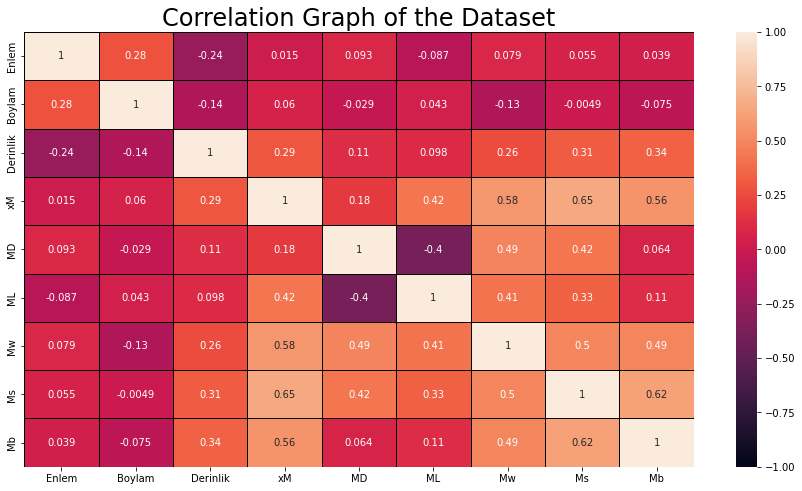

In [86]:
plt.figure(figsize=(15, 8))
correlation = sns.heatmap(data.corr(), vmin=-1, vmax=1, annot=True, linewidths=1, linecolor='black')
correlation.set_title('Correlation Graph of the Dataset', fontdict={'fontsize': 24})